In [1]:
import sys

sys.path.append('../Serre')
sys.path.append('../nswe')
sys.path.append('../')

import numpy as np
import matplotlib.pyplot as plt
import generalFunctions as gF
import muscl2
import nswe_wbmuscl4 as wb4
import serre
import serreTBC
import cnoidal
import DDM_nswe_serre as ddmNS

%matplotlib inline

In [2]:
### DDM with three subdomains (supposing at most one Serre subdomain)

def DDM3(x1,h1,u1,x2,h2,u2,x3,h3,u3,t0,tmax,bcfunction,dx,nx,
             dt = 0.05, fvsolver=muscl2.fluxes2,fvTimesolver=serre.Euler,
             ghostcells = 3,externalBC="open",coupleSerre=False,serreDomain=2,dispersiveBC = None,
             ov = 0,href=None,uref=None,xref=None, debug = False, dirichletIBC = False,eta=0.):
    
    """
    *Applies a DDM to solve the NSWE in two subdomains;
    *Possibly solve the dispersive part of the Serre equation in one of the subdomains
    
    * Inputs:
        - x1,x2,xref : subdomains/monodomain
        - h1,h2,u1,u2,href,uref : solutions in the subdomains/in the monodomain.
        - t0,tmax,dt
        - dx
        - nx: number of points in monodomain
        - bcfunction : function to impose BCs in the NSWE solver (ex: function DDM_BCs defined above)
        - fvsolver : function to compute the fluxes in the NSWE part (ex: fucntion fluxes defined above)
        - fvTimesolver : function to integrate the NSWE in time
        - ghost cells : number of ghost cells in each side
        - externalBC: "open"/"periodic" (only the "open" case is correctly defined)
        - coupleSerre : True/False : compute the dispersive part
        - serreDomain (1/2): subdomain with the dispersive equation
        - nitermax
        - dispersiveBC : BCs for the dispersive part, in the form [position,type,value,coefficients].
                         see doc in serreTBC.ipynb
        - dirichletIBC : if True, impose dirichlet in the two cells closest to the interface and
                         ignores the argument dispersiveIBC
        - ov : size of overlap (Number of overlapped cells = 1 + 2*ov, ov>=0); ov < 0  means no overlapping
        - debug : impose referential solution in ghost cells
        - eta : slope of the bottom
    """
    
    nitermax = 1 ## it's not a DDM
    
    configDDM = 2  ## overlapping
    if ov < 0: ## no overlapping
        configDDM = 1
    
    t = t0
    it = 0
    grav = 9.81
    
    uall1 = u1
    hall1 = h1
    tall1 = np.ones(1)*t0
    uall2 = u2
    hall2 = h2
    tall2 = np.ones(1)*t0
    uall3 = u3
    hall3 = h3
    tall3 = np.ones(1)*t0
    huref = href*uref
    
    while t < tmax and dt > 1e-9:
        it = it+1
        t = t+dt
        #print("t = ",t)
        
        h1prev = np.copy(h1)
        u1prev = np.copy(u1)
        h2prev = np.copy(h2)
        u2prev = np.copy(u2)
        h3prev = np.copy(h3)
        u3prev = np.copy(u3)
        hu1prev = h1prev*u1prev
        hu2prev = h2prev*u2prev
        hu3prev = h3prev*u3prev
        
        niter = 0
        converg = False
        
        while niter < nitermax and converg == False:
            
            niter = niter+1
            
            h1mm = np.copy(h1)
            u1mm = np.copy(u1)
            h2mm = np.copy(h2)
            u2mm = np.copy(u2)
            h3mm = np.copy(h3)
            u3mm = np.copy(u3)
            
            hu1 = h1*u1
            hu2 = h2*u2
            hu3 = h3*u3

            Nddm = nx/2

            if externalBC == "periodic":
                bcparam1 = np.array([[0,h3[-6],hu3[-6]], #external
                                     [1,h3[-5],hu3[-5]], #external
                                     [2,h3[-4],hu3[-4]], #external
                                     [-3,h2[3],hu2[3]],  #interface
                                     [-2,h2[4],hu2[4]],  #interface
                                     [-1,h2[5],hu2[5]]]) #interface
                bcparam2 = np.array([[0,h1[-6],hu1[-6]], #interface
                                     [1,h1[-5],hu1[-5]], #interface
                                     [2,h1[-4],hu1[-4]], #interface
                                     [-3,h3[3],hu3[3]],  #interface
                                     [-2,h3[4],hu3[4]],  #interface
                                     [-1,h3[5],hu3[5]]]) #interface
                bcparam3 = np.array([[0,h2[-6],hu2[-6]], #interface
                                     [1,h2[-5],hu2[-5]], #interface
                                     [2,h2[-4],hu2[-4]], #interface
                                     [-3,h1[3],hu1[3]],  #external
                                     [-2,h1[4],hu1[4]],  #external 
                                     [-1,h1[5],hu1[5]]]) #external
            elif externalBC == "open":
                if configDDM == 1: ## without overlapping
                    bcparam1 = np.array([[0,h1prev[3],hu1prev[3]],
                                         [1,h1prev[3],hu1prev[3]],
                                         [2,h1prev[3],hu1prev[3]],
                                         [-3,h2[3],hu2[3]],
                                         [-2,h2[4],hu2[4]],
                                         [-1,h2[5],hu2[5]]])
                    bcparam2 = np.array([[0,h1[-6],hu1[-6]],
                                         [1,h1[-5],hu1[-5]],
                                         [2,h1[-4],hu1[-4]],
                                         [-3,h2prev[-4],hu2prev[-4]],
                                         [-2,h2prev[-4],hu2prev[-4]],
                                         [-1,h2prev[-4],hu2prev[-4]]])
                elif configDDM == 2:
                    if not debug : ## with overlapping
                        bcparam1 = np.array([[0,h1prev[3],hu1prev[3]],
                                             [1,h1prev[3],hu1prev[3]],
                                             [2,h1prev[3],hu1prev[3]],
                                             [-3,h2[4+2*ov],hu2[4+2*ov]],
                                             [-2,h2[5+2*ov],hu2[5+2*ov]],
                                             [-1,h2[6+2*ov],hu2[6+2*ov]]])
                        bcparam2 = np.array([[0,h1[-7-2*ov],hu1[-7-2*ov]],
                                             [1,h1[-6-2*ov],hu1[-6-2*ov]],
                                             [2,h1[-5-2*ov],hu1[-5-2*ov]],
                                             [-3,h3[4+2*ov],hu3[4+2*ov]],
                                             [-2,h3[5+2*ov],hu3[5+2*ov]],
                                             [-1,h3[6+2*ov],hu3[6+2*ov]]])
                        bcparam3 = np.array([[0,h2[-7-2*ov],hu2[-7-2*ov]],
                                             [1,h2[-6-2*ov],hu2[-6-2*ov]],
                                             [2,h2[-5-2*ov],hu2[-5-2*ov]],
                                             [-3,h3prev[-4],hu3prev[-4]],
                                             [-2,h3prev[-4],hu3prev[-4]],
                                             [-1,h3prev[-4],hu3prev[-4]]])

                    else:
                        Nddm = nx/2
                        print(Nddm)
                        bcparam1 = np.array([[0,h1prev[3],hu1prev[3]],
                                             [1,h1prev[3],hu1prev[3]],
                                             [2,h1prev[3],hu1prev[3]],
                                             [-3,href[Nddm+1,it],huref[Nddm+1,it]],
                                             [-2,href[Nddm+2,it],huref[Nddm+2,it]],
                                             [-1,href[Nddm+3,it],huref[Nddm+3,it]]])
                        bcparam2 = np.array([[0,href[Nddm-3,it],huref[Nddm-3,it]],
                                             [1,href[Nddm-2,it],huref[Nddm-2,it]],
                                             [2,href[Nddm-1,it],huref[Nddm-1,it]],
                                             [-3,h2prev[-4],hu2prev[-4]],
                                             [-2,h2prev[-4],hu2prev[-4]],
                                             [-1,h2prev[-4],hu2prev[-4]]])

            h1,hu1 = bcfunction(h1,hu1,bcparam1,dx,t)
            h2,hu2 = bcfunction(h2,hu2,bcparam2,dx,t)
            h3,hu3 = bcfunction(h3,hu3,bcparam3,dx,t)

            h1,hu1 = fvTimesolver(x1,h1prev,hu1prev,fvsolver,bcfunction,bcparam1,dx,dt,x1.size,t,ghostcells)
            h2,hu2 = fvTimesolver(x2,h2prev,hu2prev,fvsolver,bcfunction,bcparam2,dx,dt,x2.size,t,ghostcells)
            h3,hu3 = fvTimesolver(x3,h3prev,hu3prev,fvsolver,bcfunction,bcparam3,dx,dt,x3.size,t,ghostcells)  
            

            ## correct ghost cells on the interface (unnecessary?)
            if externalBC == "open":   
                if configDDM == 1:
                    bcparam1 = np.array([[-3,h2[3],hu2[3]],
                                         [-2,h2[4],hu2[4]],
                                         [-1,h2[5],hu2[5]]])
                    bcparam2 = np.array([[0,h1[-6],hu1[-6]],
                                         [1,h1[-5],hu1[-5]],
                                         [2,h1[-4],hu1[-4]]])
                elif configDDM == 2:
                    if not debug :
                        bcparam1 = np.array([[-3,h2[4+2*ov],hu2[4+2*ov]],
                                             [-2,h2[5+2*ov],hu2[5+2*ov]],
                                             [-1,h2[6+2*ov],hu2[6+2*ov]]])
                        bcparam2 = np.array([[0,h1[-7-2*ov],hu1[-7-2*ov]],
                                             [1,h1[-6-2*ov],hu1[-6-2*ov]],
                                             [2,h1[-5-2*ov],hu1[-5-2*ov]],
                                             [-3,h3[4+2*ov],hu3[4+2*ov]],
                                             [-2,h3[5+2*ov],hu3[5+2*ov]],
                                             [-1,h3[6+2*ov],hu3[6+2*ov]]])
                        bcparam3 = np.array([[0,h3[-7-2*ov],hu3[-7-2*ov]],
                                             [1,h3[-6-2*ov],hu3[-6-2*ov]],
                                             [2,h3[-5-2*ov],hu3[-5-2*ov]]])
                    else :
                        bcparam1 = np.array([[-3,href[Nddm+1,it],huref[Nddm+1,it]],
                                             [-2,href[Nddm+2,it],huref[Nddm+2,it]],
                                             [-1,href[Nddm+3,it],huref[Nddm+3,it]]])
                        bcparam2 = np.array([[0,href[Nddm-3,it],huref[Nddm-3,it]],
                                             [1,href[Nddm-2,it],huref[Nddm-3,it]],
                                             [2,href[Nddm-1,it],huref[Nddm-1,it]]])
            h1,hu1 = bcfunction(h1,hu1,bcparam1,dx,t)
            h2,hu2 = bcfunction(h2,hu2,bcparam2,dx,t)
            h3,hu3 = bcfunction(h3,hu3,bcparam3,dx,t)
            u1 = np.where(h1[:]>1e-5, hu1[:]/h1[:], 0.)
            u2 = np.where(h2[:]>1e-5, hu2[:]/h2[:], 0.)
            u3 = np.where(h3[:]>1e-5, hu3[:]/h3[:], 0.)
            
            ## verify convergence
            eps = 1e-9
            if  np.linalg.norm(h1-h1mm) < eps and np.linalg.norm(h2-h2mm) < eps and \
                np.linalg.norm(u1-u1mm) < eps and np.linalg.norm(u2-u2mm) < eps and \
                np.linalg.norm(u3-u3mm) < eps and np.linalg.norm(h3-h3mm) < eps :
                    converg = True

            ## Error in the subdomains
            nxx = uref.shape[0]
            err1 = np.linalg.norm(u1[3:-3]-uref[3:u1.size-3,it])
            err2 = np.linalg.norm(u2[3:-3]-uref[u1.size-4:u1.size-4+u2.size-6,it])
            err3 = np.linalg.norm(u3[3:-3]-uref[nxx-u3.size+3:-3,it])
            
            if not coupleSerre :
                print("")
                print("t = %f"%t)
                print("Error wr to monodomain solution (Om1,Om2): ",err1,err2,err3)
                print("niter", niter)
                print("")
            
        #solve Dispersion for one of the domains
        FDorder = 4  ## order of FD scheme
        
        if coupleSerre:
            if serreDomain == 1:  ## serre in the left
                    ## define boundary conditions
                
                if dirichletIBC :  ## Dirichlet condition
                    dispersiveBC = np.array([[0,"Robin",u1[0],1.,0.], ##dispersiveBC = np.array([[0,"Robin",0.,1.,0.]
                                     [-2,"Robin",u1[-5],1.,0.], ## external boundaries
                                     [-1,"Robin",u1[-4],1.,0.]]) ## interface : Dirichlet 
                u1aux = serreTBC.EFDSolverFM4(h1[3:-3],u1[3:-3],dx,dt,FDorder,dispersiveBC)
                u1 = np.hstack((u1[:3],u1aux,u1[-3:]))               
                ## copy to overlapped area
                u2[3:4+2*ov] = u1[-4-2*ov:-3]
            elif serreDomain == 2:
                if dirichletIBC :
                    dispersiveBC = np.array([[0,"Robin",u2[3],1.,0.],
                                     [1,"Robin",u2[4],1.,0.],
                                     [-1,"Robin",u2[-4],1.,0.]])
                u2aux = serreTBC.EFDSolverFM4(h2[3:-3],u2[3:-3],dx,dt,FDorder,dispersiveBC)
                u2 = np.hstack((u2[:3],u2aux,u2[-3:]))
                ## copy to overlapped area
                u1[-4-2*ov:-3] = u2[3:4+2*ov]
                u3[3:4+2*ov] = u2[-4-2*ov:-3]
            elif serreDomain == 3:
                if dirichletIBC :
                    dispersiveBC = np.array([[0,"Robin",u3[3],1.,0.],
                                     [1,"Robin",u3[4],1.,0.],
                                     [-1,"Robin",0.,1.,0.]])
                u3aux = serreTBC.EFDSolverFM4(h3[3:-3],u3[3:-3],dx,dt,FDorder,dispersiveBC)
                u3 = np.hstack((u3[:3],u3aux,u3[-3:]))
                ## to code
                
        hall1 = np.column_stack((hall1,h1))
        uall1 = np.column_stack((uall1,u1))
        tall1 = np.hstack((tall1,t*np.ones(1)))

        hall2 = np.column_stack((hall2,h2))
        uall2 = np.column_stack((uall2,u2))
        tall2 = np.hstack((tall2,t*np.ones(1)))
        
        hall3 = np.column_stack((hall3,h3))
        uall3 = np.column_stack((uall3,u3))
        tall3 = np.hstack((tall3,t*np.ones(1)))
    return hall1,uall1,tall1,hall2,uall2,tall2,hall3,uall3,tall3

## Initial solution and bottom configuration

In [3]:
a0 = 1.
a1 = .075 ## 0.05
k = 0.
g = 9.81
t0 = 0.0
t = t0
tmax = 15.
dt = 0.05

lam, h0 = cnoidal.WaveLengthDepth(k,a0,a1)

L = 4*lam
xmin = -L
xmax = L
nx = 100

dx1 = (xmax-xmin)/(nx)

x,dx = serre.discretizeSpace(xmin-3.*dx1,xmax+3.*dx1,nx+6)
dx = np.diff(x)[0]

H = 2.
Hh = .9

In [4]:
## BOTTOM
### we are using the bottom d03 defined below
### objectif : create a C\infty bottom, horizontal in the domain boundaries

eta = 0.1 ## linear slope
Lslope1 = xmin+4*nx/6*dx ## initial position of the linear bottom d0
Lslope2 = xmin+5/6*nx*dx ## initial position of the linear bottom d0
d0 = np.where(x<Lslope1, h0-H, np.where(x>Lslope2,h0-Hh,h0-H + (x-Lslope1)/(-Lslope1+Lslope2)*(H-Hh)))
d02 = np.arctan(x/10) ## C\infty bottom (control the slope with the factor dividing x )
d03 = d02*(h0-Hh)/np.amax(d02) ## normalization of d02 regarding d0

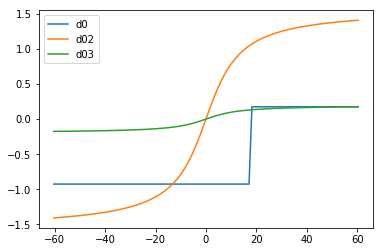

In [5]:
plt.plot(x,d0,label="d0")
plt.plot(x,d02,label="d02")
plt.plot(x,d03,label="d03")
plt.legend(loc=0)

### NSWE in monodomain

In [6]:
h,u = cnoidal.analyticalSolutionSolitary(x-.5*xmin,t,a0,a1)
h = h-d03

print(x.size,h.size,u.size)
hall,uall,tall = serre.NSWE(x,h,u,t0,tmax,ddmNS.openDomainThreeGC,None,dx,x.size,vardt = False, dt = dt,
                              fvsolver=ddmNS.fluxes, ghostcells=3,fvTimesolver=serre.Euler)

umin = np.amin(uall)
umax = np.amax(uall)
hmin = np.amin(hall)
hmax = np.amax(hall)

## store referential solution
xM = np.copy(x)
uallM = np.copy(uall)
hallM = np.copy(hall)
tallM = np.copy(tall)

(107, 107, 107)
CFL = 0.033823


In [7]:
hmax

1.3040264530810979

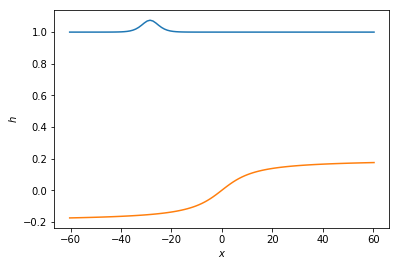

In [8]:
plt.plot(x,h+d03)
plt.plot(x,d03)
plt.xlabel(r"$x$")
plt.ylabel(r"$h$")
plt.savefig("Figures/bottom.png")

In [9]:
## FOR PRINTING
### store d0 for all instants
### add d0 to h to obtain the surface elevation

hallMP = np.copy(hall)
d0all = np.copy(hall)

for i in range (tall.size):
    d0all[:,i] = d03
    hallMP[:,i] = hallM[:,i] + d03

*** Plotting animation ...



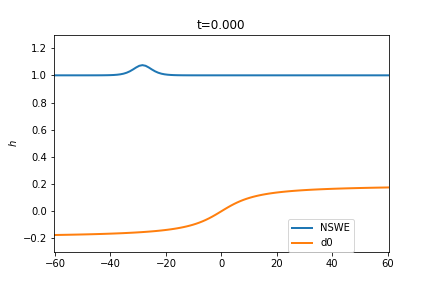
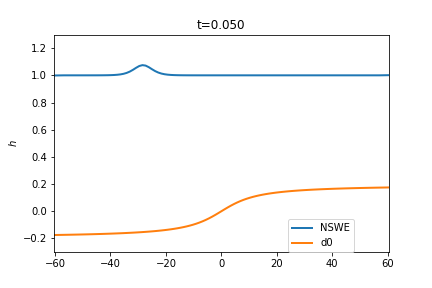
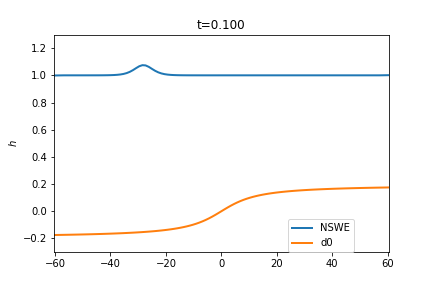
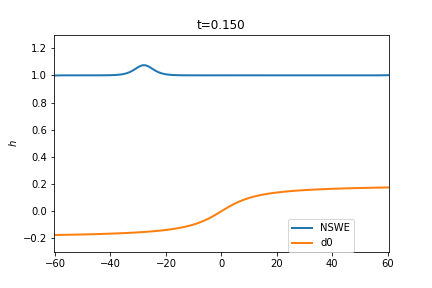
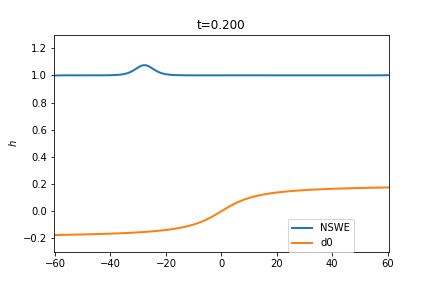
...
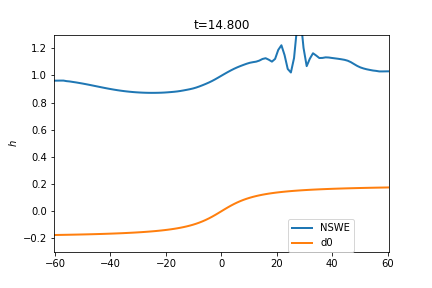
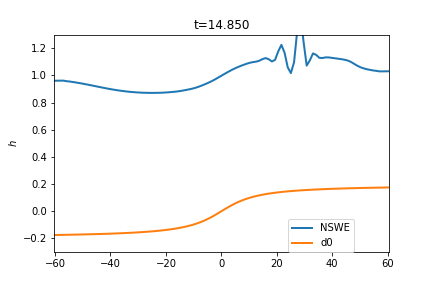
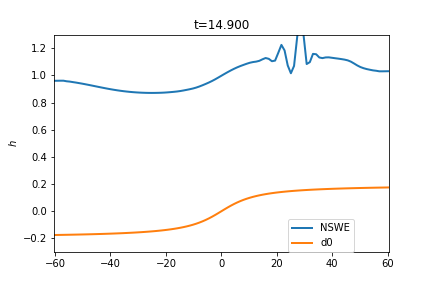
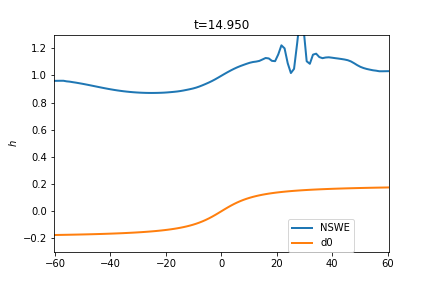
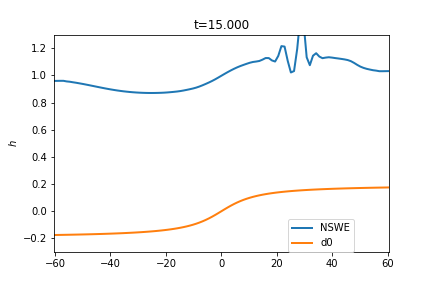

In [10]:
lb = ["NSWE", "d0"]
gF.plotAnimationNSolutions(2,x,np.array([hallMP,d0all]),tallM,x[0],x[-1],-0.3,1.3,lb,ylabel=r'$h$',location=(0.7,0.))

## DDM NSWE-NSWE-NSWE (for comparing with the coupling)

In [11]:
## DDM

Nddm1 = x.size/3
Nddm2 = 2*Nddm1

configDDM = 2 ## With overtlapping
#overlapping size
ov = 0 ## ov = 0: 1 cell overlapped

if configDDM == 1:
    x1 = x[0:Nddm1+3] ## (0:Nddm+1) + 3 gc 
    x2 = x[Nddm1-3:Nddm2+3] ## 3gc + (Nddm:)
    x3 = x[Nddm2-3:] ## 3gc + (Nddm:)
    h1 = h[0:Nddm+3]
    h2 = h[Nddm-3:]
    u1 = u[0:Nddm+3]
    u2 = u[Nddm-3:]
elif configDDM == 2:
    x1 = x[0:Nddm1+4+ov] ## (0:Nddm+1) + 3 gc + ov
    x2 = x[Nddm1-3-ov:Nddm2+4+ov] ## ov + 3gc + (Nddm:)
    x3 = x[Nddm2-3-ov:] ## ov + 3gc + (Nddm:)
    h1 = h[0:Nddm1+4+ov] ## (0:Nddm+1) + 3 gc + ov
    h2 = h[Nddm1-3-ov:Nddm2+4+ov] ## ov + 3gc + (Nddm:)
    h3 = h[Nddm2-3-ov:] ## ov + 3gc + (Nddm:)
    u1 = u[0:Nddm1+4+ov] ## (0:Nddm+1) + 3 gc + ov
    u2 = u[Nddm1-3-ov:Nddm2+4+ov] ## ov + 3gc + (Nddm:)
    u3 = u[Nddm2-3-ov:] ## ov + 3gc + (Nddm:)

## TBC for dispersive equation
## in right domain

print(x1[-3]-x2[4+2*ov],x2[0]-x1[-7-2*ov],x2[-3]-x3[4+2*ov])
print(x1.size,x2.size,x3.size)

(0.0, 0.0, 0.0)
(39, 42, 40)


In [12]:
hall1,uall1,tall1,hall2,uall2,tall2,hall3,uall3,tall3 = DDM3(x1,h1,u1,x2,h2,u2,x3,h3,u3,
            t0,tmax,ddmNS.DDM_BCs,dx,nx+6,
             dt = dt, fvsolver=ddmNS.fluxes,
             ghostcells = 3, externalBC="open",coupleSerre=False,ov=ov,uref=uallM,
                                              href = hallM,xref=x,debug=False, fvTimesolver=serre.Euler)

umin = np.amin(uall1)
umax = np.amax(uall1)
hmin = np.amin(hall1)
hmax = np.amax(hall1)


t = 0.050000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 0.100000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 0.150000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 0.200000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 0.250000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 0.300000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 0.350000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 0.400000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 0.450000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 0.500000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 0.550000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 0.600000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 0.650000
('Error wr to monodomain solution (Om1,Om2): ', 0.


t = 5.600000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 5.650000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 5.700000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 5.750000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 5.800000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 5.850000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 5.900000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 5.950000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 6.000000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 6.050000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 6.100000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 6.150000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 6.200000
('Error wr to monodomain solution (Om1,Om2): ', 0.


t = 11.300000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 11.350000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 11.400000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 11.450000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 11.500000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 11.550000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 11.600000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 11.650000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 11.700000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 11.750000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 11.800000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 11.850000
('Error wr to monodomain solution (Om1,Om2): ', 0.0, 0.0, 0.0)


t = 11.900000
('Error wr to monodomain solution (Om

In [13]:
### remove ghost cells for Printing
x1P = x1[3:-3]
x2P = x2[3:-3]
x3P = x3[3:-3]

d0all1 = np.zeros_like(hall1)
d0all2 = np.zeros_like(hall2)
d0all3 = np.zeros_like(hall3)
for i in range (tall1.size):
    d0all1[:x1.size,i] = d03[:Nddm1+4]
    d0all2[:,i] = d03[Nddm1-3:Nddm2+4]  
    d0all3[:,i] = d03[Nddm2-3:]
    hall1[:,i] = hall1[:,i] + d0all1[:,i]
    hall2[:,i] = hall2[:,i] + d0all2[:,i]
    hall3[:,i] = hall3[:,i] + d0all3[:,i]

d0all1P = d0all1[3:-3,:]
d0all2P = d0all2[3:-3,:]
d0all3P = d0all3[3:-3,:]
uall1P = uall1[3:-3,:]
uall2P = uall2[3:-3,:]
uall3P = uall3[3:-3,:]
hall1P = hall1[3:-3,:]
hall2P = hall2[3:-3,:]
hall3P = hall3[3:-3,:]

*** Plotting animation ...



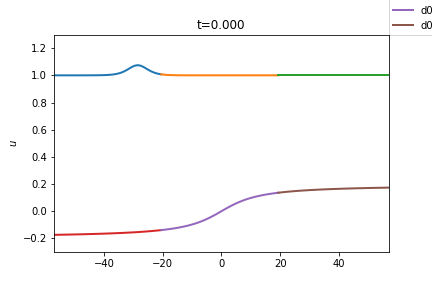
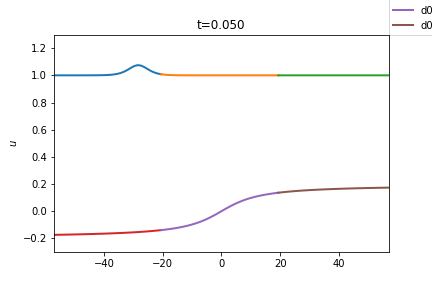
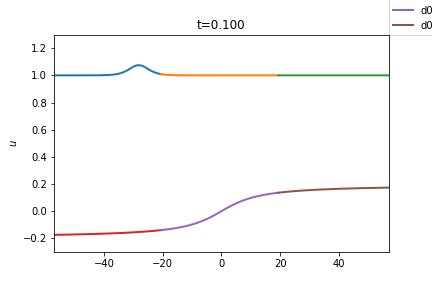
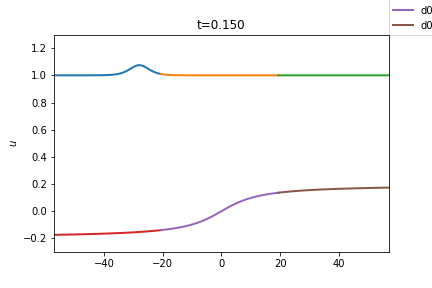
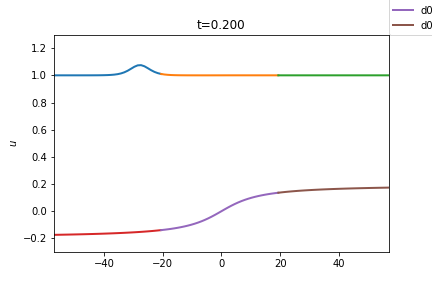
...
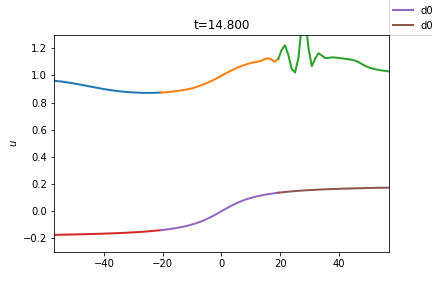
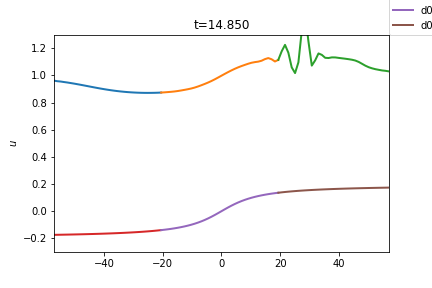
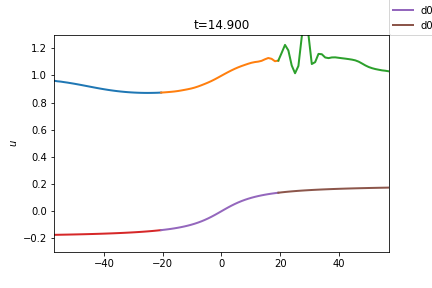
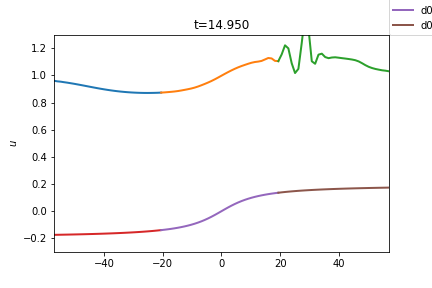
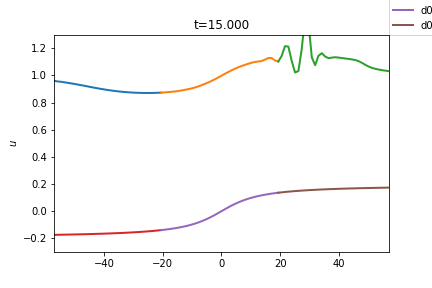

In [14]:
lb = ["Full NSWE ($\Omega_1$)","Full NSWE ($\Omega_2$)", "Full NSWE ($\Omega_3$)","d0","d0","d0"]
gF.plotAnimationNSolutionsDiffDomain(6,np.array([x1P,x2P,x3P,x1P,x2P,x3P]),
                                     np.array([hall1P,hall2P,hall3P,d0all1P,d0all2P,d0all3P]),
                                     tall1,xmin,xmax,-0.3,1.3,lb,ylabel=r'$u$',location=(1,1))

## Coupling NSWE-Serre-NSWE with open left boundary

In [15]:
Nddm1 = x.size/3
Nddm2 = 2*Nddm1

configDDM = 2 ## With overtlapping
#overlapping size
ov = 0 ## ov = 0: 1 cell overlapped

if configDDM == 1:
    x1 = x[0:Nddm1+3] ## (0:Nddm+1) + 3 gc 
    x2 = x[Nddm1-3:Nddm2+3] ## 3gc + (Nddm:)
    x3 = x[Nddm2-3:] ## 3gc + (Nddm:)
    h1 = h[0:Nddm+3]
    h2 = h[Nddm-3:]
    u1 = u[0:Nddm+3]
    u2 = u[Nddm-3:]
elif configDDM == 2:
    x1 = x[0:Nddm1+4+ov] ## (0:Nddm+1) + 3 gc + ov
    x2 = x[Nddm1-3-ov:Nddm2+4+ov] ## ov + 3gc + (Nddm:)
    x3 = x[Nddm2-3-ov:] ## ov + 3gc + (Nddm:)
    h1 = h[0:Nddm1+4+ov] ## (0:Nddm+1) + 3 gc + ov
    h2 = h[Nddm1-3-ov:Nddm2+4+ov] ## ov + 3gc + (Nddm:)
    h3 = h[Nddm2-3-ov:] ## ov + 3gc + (Nddm:)
    u1 = u[0:Nddm1+4+ov] ## (0:Nddm+1) + 3 gc + ov
    u2 = u[Nddm1-3-ov:Nddm2+4+ov] ## ov + 3gc + (Nddm:)
    u3 = u[Nddm2-3-ov:] ## ov + 3gc + (Nddm:)


    
hall1DL,uall1DL,tall1DL,hall2DL,uall2DL,tall2DL,hall3DL,uall3DL,tall3DL =DDM3(x1,h1,u1,x2,h2,u2,x3,h3,u3,
            t0,tmax,ddmNS.DDM_BCs,dx,nx,
             dt = dt, fvsolver=ddmNS.fluxes,
             ghostcells = 3, externalBC="open",coupleSerre=True,serreDomain=2,dispersiveBC=None,
             ov=ov,fvTimesolver=serre.Euler,uref=uallM,
                                              href = hallM,xref=x,dirichletIBC=True,eta=eta)

umin = np.amin(uall1)
umax = np.amax(uall1)
hmin = np.amin(hall1)
hmax = np.amax(hall1)



In [16]:
### Preparing vectors for printing

### remove ghost cells
x1DLP = x1[3:-3]
x2DLP = x2[3:-3]
x3DLP = x3[3:-3]
uall1DLP = uall1DL[3:-3,:]
uall2DLP = uall2DL[3:-3,:]
uall3DLP = uall3DL[3:-3,:]
hall1DLP = hall1DL[3:-3,:]
hall2DLP = hall2DL[3:-3,:]
hall3DLP = hall3DL[3:-3,:]

### add bottom to h
d0all1DL = np.zeros_like(hall1DL)
d0all2DL = np.zeros_like(hall2DL)
d0all3DL = np.zeros_like(hall3DL)
for i in range (tall1DL.size):
    d0all1DL[:x1.size,i] = d03[:Nddm1+4]
    d0all2DL[:,i] = d03[Nddm1-3:Nddm2+4]   
    d0all3DL[:,i] = d03[Nddm2-3:] 
    hall1DL[:,i] = hall1DL[:,i] + d0all1DL[:,i]
    hall2DL[:,i] = hall2DL[:,i] + d0all2DL[:,i]
    hall3DL[:,i] = hall3DL[:,i] + d0all3DL[:,i]  
    
d0all1DLP = d0all1DL[3:-3,:]
d0all2DLP = d0all2DL[3:-3,:]
d0all3DLP = d0all3DL[3:-3,:]
uall1DLP = uall1DL[3:-3,:]
uall2DLP = uall2DL[3:-3,:]
uall3DLP = uall3DL[3:-3,:]
hall1DLP = hall1DL[3:-3,:]
hall2DLP = hall2DL[3:-3,:]
hall3DLP = hall3DL[3:-3,:]

*** Plotting animation ...



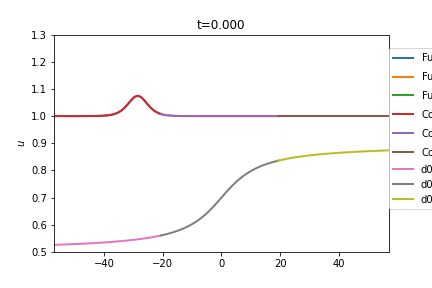
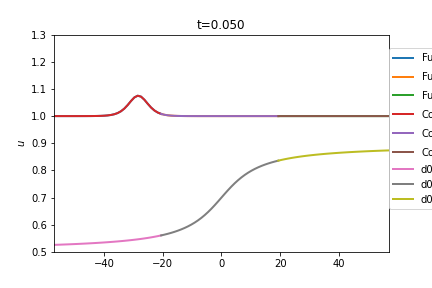
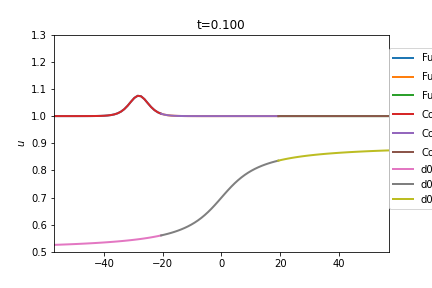
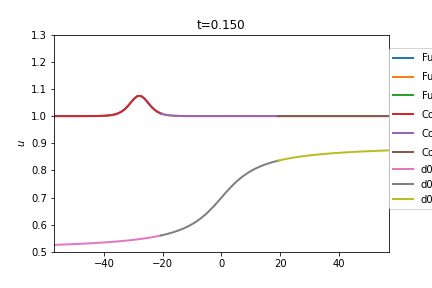
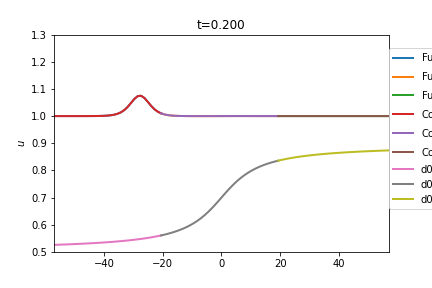
...
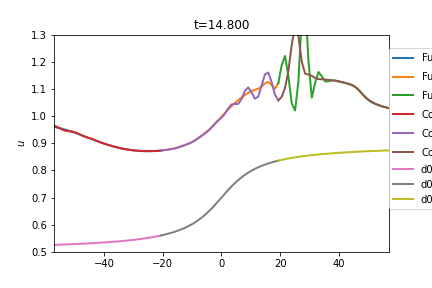
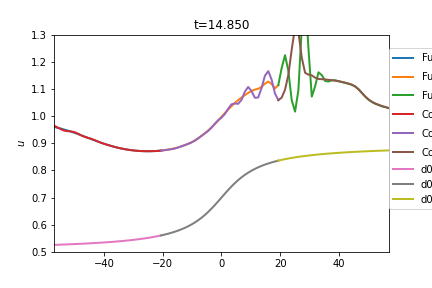
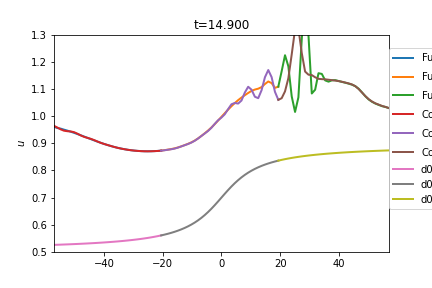
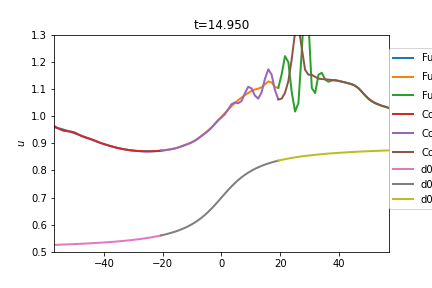
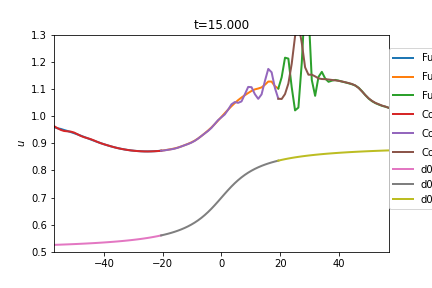

In [17]:
lb = ["Full NSWE ($\Omega_1$)","Full NSWE ($\Omega_2$)","Full NSWE ($\Omega_3$)",
      "Coupling ($\Omega_1$)", "Coupling ($\Omega_2$)","Coupling ($\Omega_3$)",
      "d0","d0","d0"]
gF.plotAnimationNSolutionsDiffDomain(9,np.array([x1P,x2P,x3P,x1DLP,x2DLP,x3DLP,x1P,x2P,x3P]),
                                     np.array([hall1P,hall2P,hall3P,hall1DLP,hall2DLP,hall3DLP,
                                               d0all1DLP+.7,d0all2DLP+.7,d0all3DLP+.7]),
                                     tall1DL,xmin,xmax,0.5,1.3,lb,ylabel=r'$u$',location=(1.,.2))

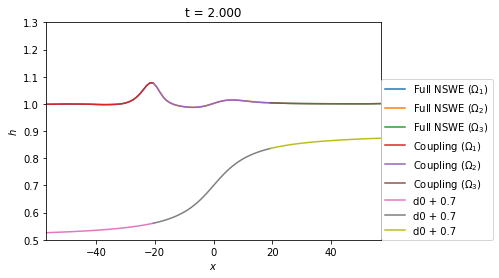

In [18]:
reload(gF)
lbl = ["Full NSWE ($\Omega_1$)","Full NSWE ($\Omega_2$)","Full NSWE ($\Omega_3$)",
      "Coupling ($\Omega_1$)", "Coupling ($\Omega_2$)","Coupling ($\Omega_3$)",
      "d0 + 0.7","d0 + 0.7","d0 + 0.7"]
xlbl=r'$x$'
ylbl=r'$h$'
path="Figures/ThreeSubdomains_open_A"
## t = 2 6 8 10
gF.saveSnapshotNsolutionsDiffDomain(9,int(2./dt),np.array([x1P,x2P,x3P,x1DLP,x2DLP,x3DLP,x1P,x2P,x3P]),
                                     np.array([hall1P,hall2P,hall3P,hall1DLP,hall2DLP,hall3DLP,d0all1DLP+.7,
                                               d0all2DLP+.7,d0all3DLP+.7]),
                                     tall1DL,lbl,xlbl,ylbl,path,
                           xmin,xmax,0.5,1.3,ext="png",legloc=(1.,0.))

## Coupling NSWE-Serre-NSWE with constant height on the left boundary

to come